# Test 2-Stage OpenPose with MobileNet Backbone

In [1]:
import os
import sys
import json
import collections
from tqdm import tqdm

import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from torch.nn import DataParallel
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

sys.path.append("..")

from data import StyledCoco
import models
from CONFIG import CONFIG
import CONSTANTS
import data
import lib.arguments as arguments
import lib.utils as utils
import lib.metrics as metrics
import lib.pose_parsing as pose_parsing 
import lib.visualizations as visualizations

In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
test_exp = "test/experiment_2020-06-04_08-06-38"
test_exp = os.path.join(CONFIG["paths"]["experiments_path"], test_exp)

## Dataset

In [4]:
image_size = 600
exp_data = utils.load_experiment_parameters(test_exp)
exp_data["training"]["batch_size"] = 1
exp_data["dataset"]["dataset_name"] = "coco"
exp_data["dataset"]["image_size"] = image_size
exp_data["model"]["model_name"] = "OpenPose"

In [5]:
_, valid_loader = data.load_dataset(exp_data=exp_data, train=False,
                                    validation=True, shuffle_train=True,
                                    shuffle_valid=False)

_, random_loader = data.load_dataset(exp_data=exp_data, train=False,
                                    validation=True, shuffle_train=True,
                                    shuffle_valid=True)

loading annotations into memory...
Done (t=0.37s)
creating index...
index created!
loading annotations into memory...
Done (t=0.35s)
creating index...
index created!


## Model

In [6]:
model = models.OpenPose()
pretrained_path = os.path.join(CONFIG["paths"]["pretrained_path"], "OpenPose", "checkpoint_iter_370000.pth")
model.load_pretrained(pretrained_path)

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

## Inference

In [24]:
# iterator = iter(valid_loader)
# for i in range(1):
#     imgs, heatmaps, pafs, mask, metadata = iterator.next()
imgs, heatmaps, pafs, mask, metadata = iter(random_loader).next()

In [25]:
print(imgs.shape)
print(heatmaps.shape)
print(pafs.shape)
print(metadata.keys())

torch.Size([1, 3, 600, 600])
torch.Size([1, 19, 600, 600])
torch.Size([1, 38, 600, 600])
dict_keys(['image_name', 'image_shape', 'bboxes'])


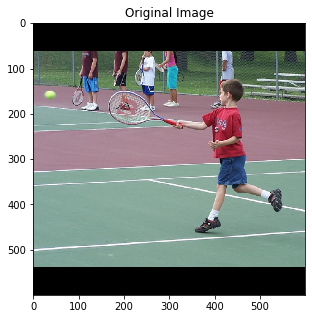

In [26]:
plt.figure(figsize=(6, 5))

ax = plt.gca()
visualizations.visualize_image(np.array(imgs[0,:]), ax=ax, title="Original Image", bgr=True)

In [27]:
model.eval()
with torch.no_grad():
    
    stages_output = model(imgs.to(device).float())
    pred_pafs_ = stages_output[-1]
    pred_heatmaps_ = stages_output[-2]
    
    scaled_pafs = F.interpolate(pred_pafs_.clone().detach(), image_size, mode="bilinear", align_corners=True).to(device)
    scaled_hms = F.interpolate(pred_heatmaps_.clone().detach(), image_size, mode="bilinear", align_corners=True).to(device)

In [28]:
def multiscale_inference(model, imgs, scales, image_size, device):
    
    batch_size = imgs.shape[0]
    avg_heatmaps = np.zeros((batch_size, 19, image_size, image_size), dtype=np.float32)
    avg_pafs = np.zeros((batch_size, 38, image_size, image_size), dtype=np.float32)
    avg_heatmaps = torch.Tensor(avg_heatmaps).to(device)
    avg_pafs = torch.Tensor(avg_pafs).to(device)
    
    for ratio in scales:
        
#         scaled_img = cv2.resize(imgs, (0, 0), fx=ratio, fy=ratio, interpolation=cv2.INTER_CUBIC)
        scaled_img = F.interpolate(imgs, int(round(ratio*image_size)), mode="bilinear", align_corners=True)
        print(scaled_img.shape)
        
        stages_output = model(scaled_img.to(device).float())
        pred_pafs_ = stages_output[-1]
        pred_heatmaps_ = stages_output[-2]
        
        scaled_pafs = F.interpolate(pred_pafs_.clone().detach(), image_size, mode="bilinear", align_corners=True).to(device)
        scaled_hms = F.interpolate(pred_heatmaps_.clone().detach(), image_size, mode="bilinear", align_corners=True).to(device)
        
        avg_heatmaps += scaled_hms
        avg_pafs += scaled_pafs
    
    avg_heatmaps = avg_heatmaps/len(scales)
    avg_pafs = avg_pafs/len(scales)
    
    return avg_heatmaps, avg_pafs

    

In [1]:
scales = [0.5, 1.0, 1.5, 2.0]
scaled_hms, scaled_pafs = multiscale_inference(model, imgs, scales, image_size, device)

NameError: name 'multiscale_inference' is not defined

In [30]:
print(scaled_hms.shape)
print(scaled_pafs.shape)

torch.Size([1, 19, 600, 600])
torch.Size([1, 38, 600, 600])


In [31]:
scaled_hms = np.array(scaled_hms[0,:].cpu())
scaled_pafs = np.array(scaled_pafs[0,:].cpu())

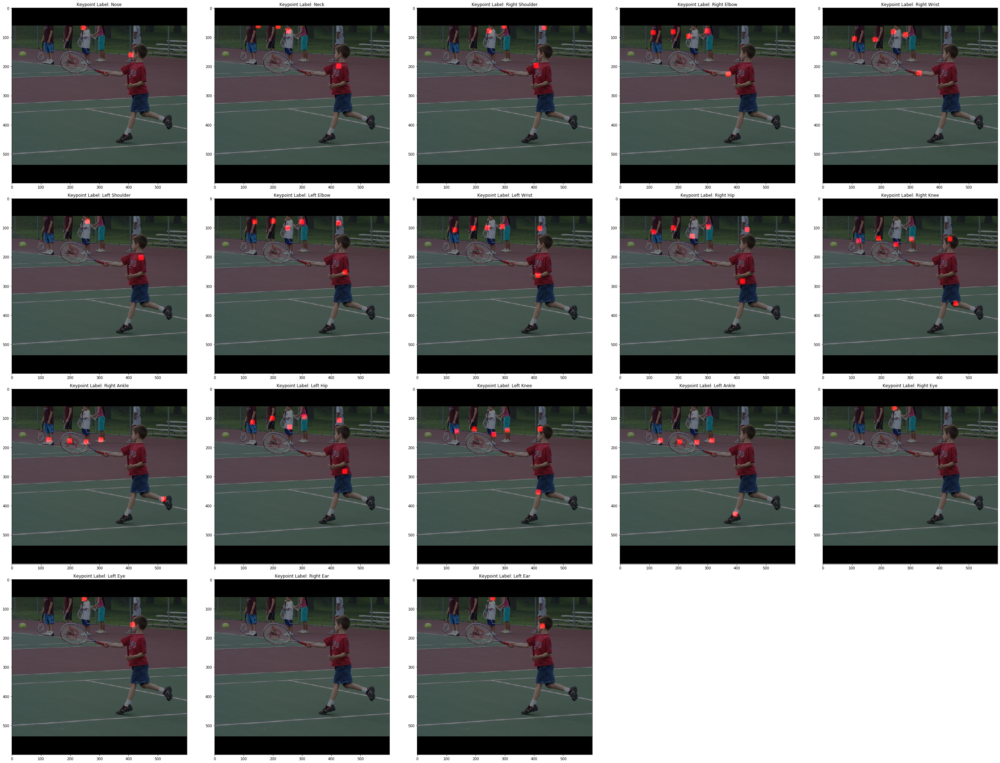

In [33]:
plt.figure(figsize=(40,30))
for i in range(18):
    plt.subplot(4,5,i+1)
    ax = plt.gca()
    title = f"Keypoint Label: {CONSTANTS.IDX_TO_KPT_NAME_OPEN_POSE[i]}"
    visualizations.overlay_heatmap(heatmap=np.array(heatmaps[0,i,:]), img=np.array(imgs[0,:]), ax=ax, title=title, bgr=True)
plt.tight_layout()
plt.show()

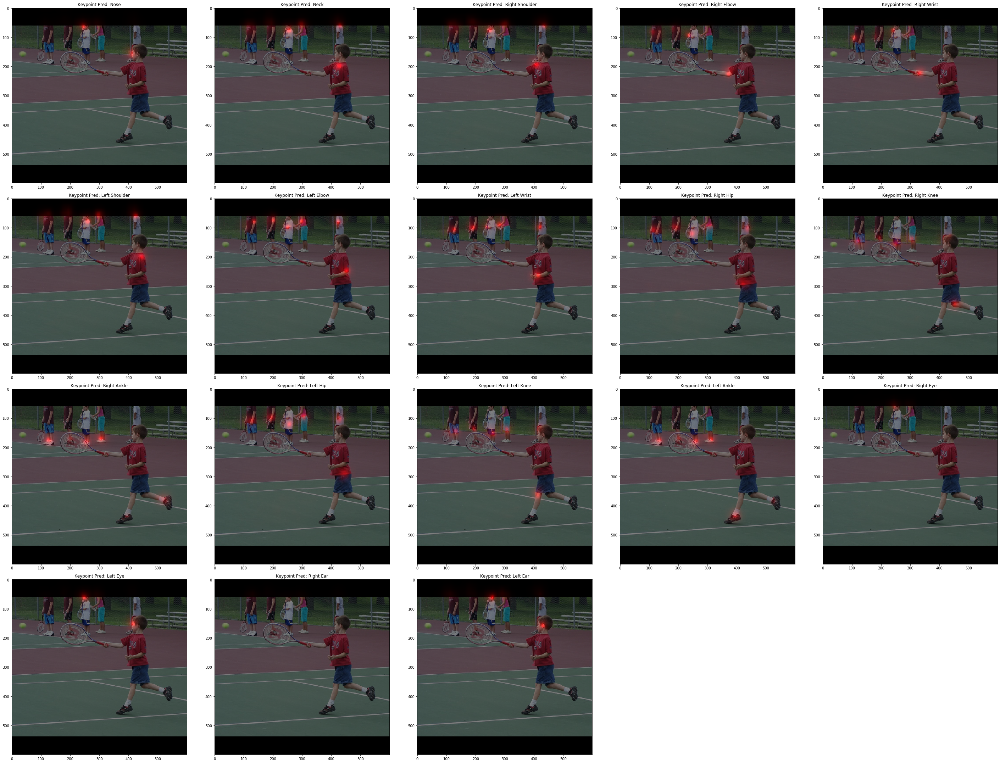

In [34]:
plt.figure(figsize=(40,30))
for i in range(18):
    plt.subplot(4,5,i+1)
    ax = plt.gca()
    title = f"Keypoint Pred: {CONSTANTS.IDX_TO_KPT_NAME_OPEN_POSE[i]}"
    visualizations.overlay_heatmap(heatmap=scaled_hms[i,:], img=np.array(imgs[0,:]), ax=ax, title=title, bgr=True)
plt.tight_layout()
plt.show()

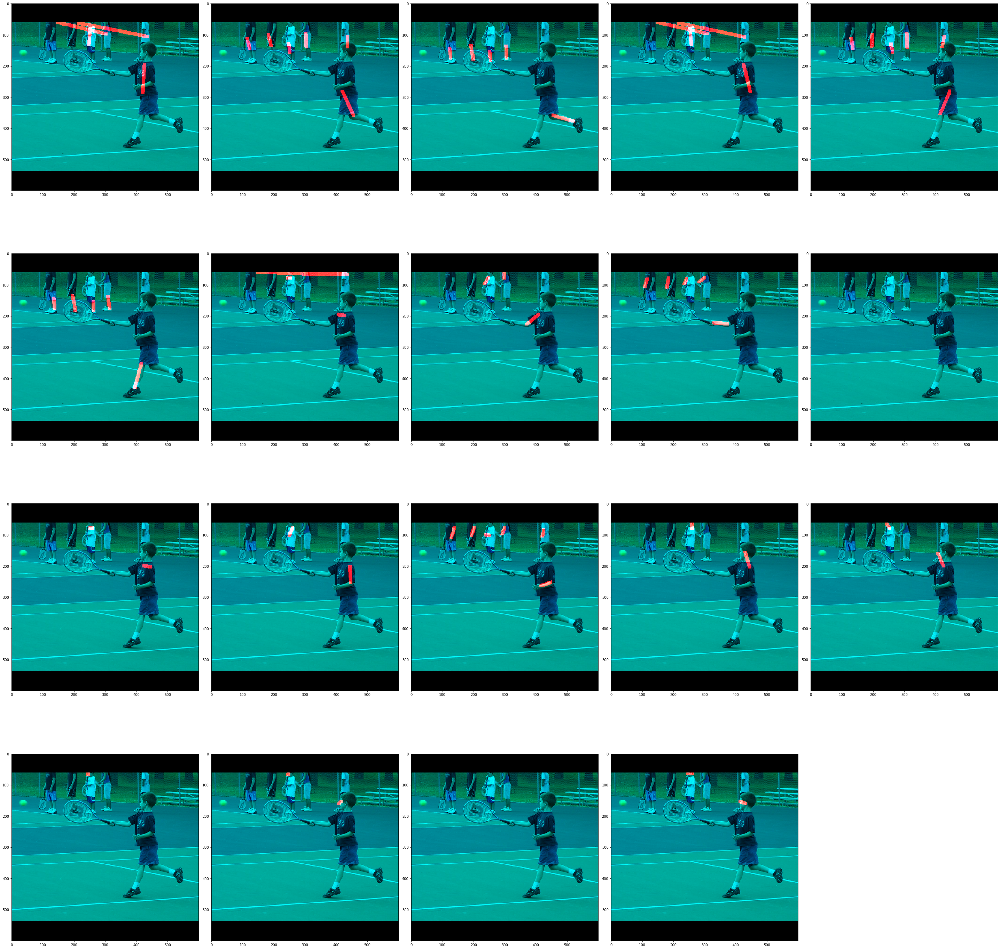

In [36]:
plt.figure(figsize=(40,60))
for i in range(19):
    plt.subplot(6,5,i+1)
    ax = plt.gca()
    visualizations.overlay_paf(pafs=np.array(pafs[0,2*i:2*i+2,:]), img=np.array(imgs[0,:]), ax=ax, bgr=True)
plt.tight_layout()
plt.show()

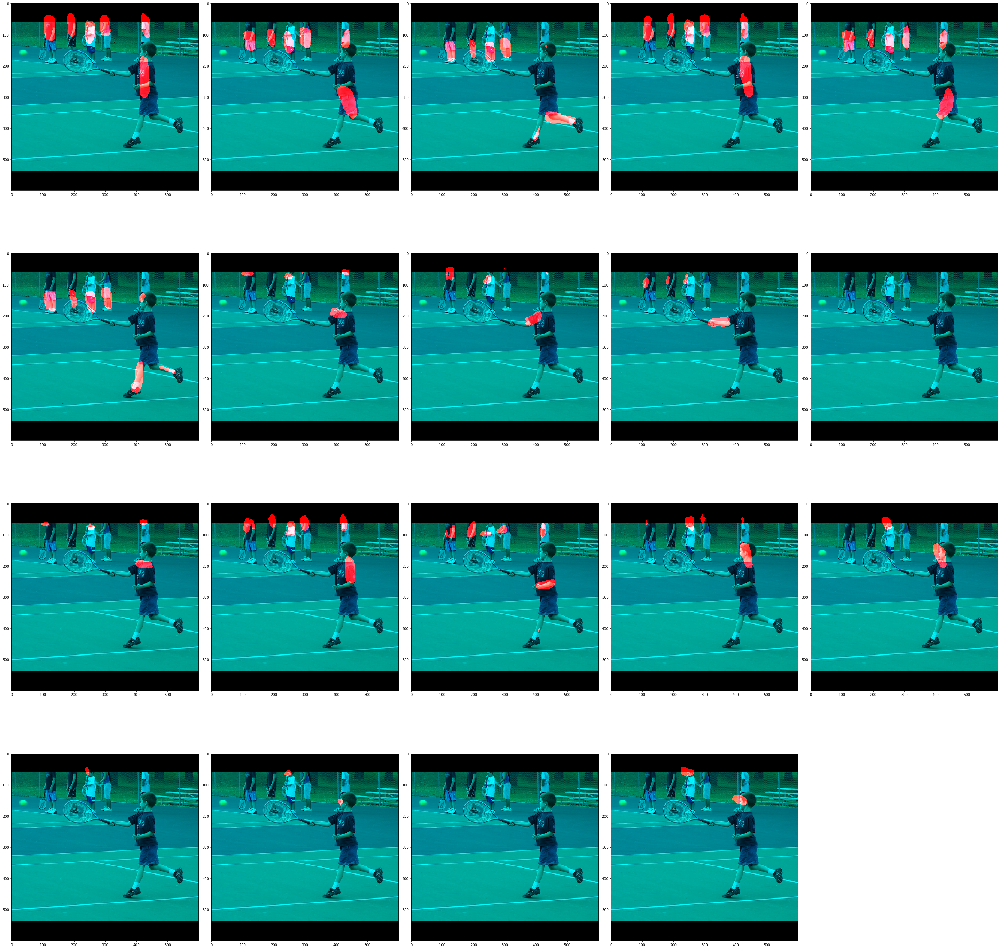

In [37]:
plt.figure(figsize=(40,60))
for i in range(19):
    plt.subplot(6,5,i+1)
    ax = plt.gca()
    visualizations.overlay_paf(pafs=scaled_pafs[2*i:2*i+2,:], img=np.array(imgs[0,:]), ax=ax, bgr=True)
plt.tight_layout()
plt.show()

## Grouping and Skeleton Rendering


In [38]:
cur_img = np.array(imgs[0,:])

In [73]:
coords_1, keypoints_1 = pose_parsing.extract_joins_heatmap(heatmaps[0,:], min_distance=1, thr=0.3)
coords_2, keypoints_2 = pose_parsing.extract_joins_heatmap(scaled_hms, min_distance=1, thr=0.3)

torch.Size([600, 600])
5
(600, 600)
5


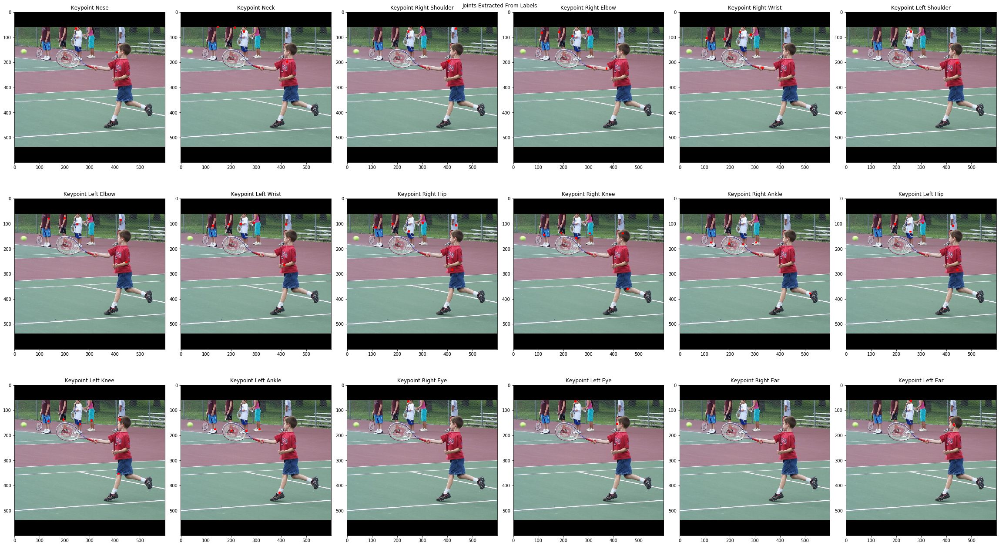

In [41]:
plt.figure(figsize=(32, 18))
zoom = 4

aux_img = np.array([cur_img[2,:,:], cur_img[1,:,:], cur_img[0,:,:]])
aux_img = np.copy(aux_img).transpose(1,2,0)*256 + 128
aux_img = np.round(aux_img).astype(int)

for i, keypoint in enumerate(keypoints_1):
    
    aux = np.copy(aux_img)
    if(len(keypoint) > 0):
        for k in keypoint:
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,0] = 255
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,1] = 0
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,2] = 0
    
    plt.subplot(3,6,i+1)
    plt.imshow(aux)
    plt.title(f"Keypoint {CONSTANTS.IDX_TO_KPT_NAME_OPEN_POSE[i]}")
    
    
plt.suptitle("Joints Extracted From Labels")
plt.tight_layout()
plt.show()

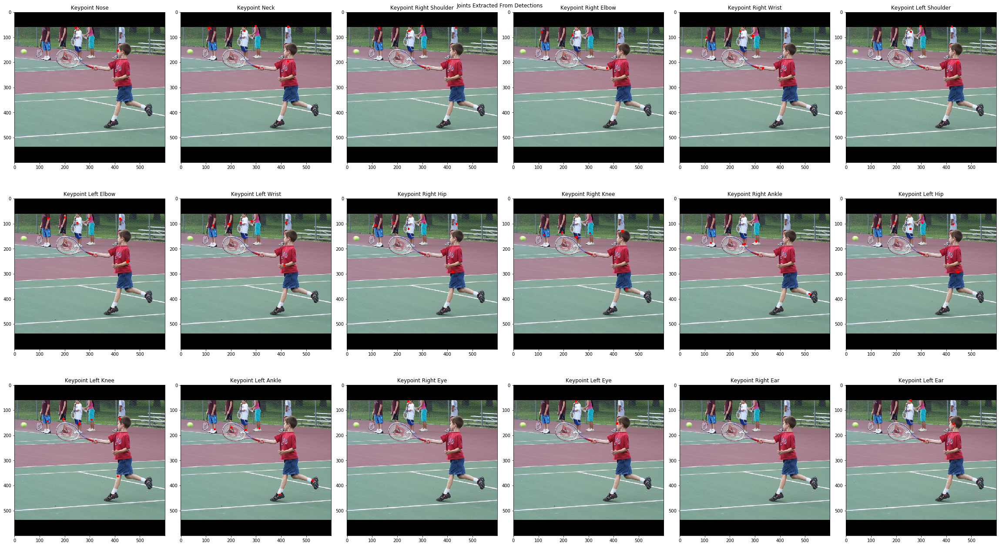

In [42]:
plt.figure(figsize=(32, 18))
zoom = 4

aux_img = np.array([cur_img[2,:,:], cur_img[1,:,:], cur_img[0,:,:]])
aux_img = np.copy(aux_img).transpose(1,2,0)*256 + 128
aux_img = np.round(aux_img).astype(int)

for i, keypoint in enumerate(keypoints_2):
    
    aux = np.copy(aux_img)
    if(len(keypoint) > 0):
        for k in keypoint:
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,0] = 255
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,1] = 0
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,2] = 0
    
    plt.subplot(3,6,i+1)
    plt.imshow(aux)
    plt.title(f"Keypoint {CONSTANTS.IDX_TO_KPT_NAME_OPEN_POSE[i]}")
    
plt.suptitle("Joints Extracted From Detections")
plt.tight_layout()
plt.show()

In [43]:
pose_parsing.BODY_PARTS_PAF_IDS = CONSTANTS.BODY_PARTS_PAF_IDS_OPEN_POSE
pose_parsing.SKELETON = CONSTANTS.SKELETON_OPEN_POSE

In [44]:
# pose_entries, all_keypoints = pose_parsing.group_keypoints(keypoints_1, pafs[0,:], min_paf_score=0.05, thr_ratio=0.8)
pose_entries, all_keypoints, pose_entries_aux = pose_parsing.group_keypoints(keypoints_1, pafs[0,:], min_paf_score=0.05, thr_ratio=0.8, debug=True)

In [45]:
# pose_entries_det, all_keypoints_det = pose_parsing.group_keypoints(keypoints_2, scaled_pafs, min_paf_score=0.05, thr_ratio=0.8)
pose_entries_det, all_keypoints_det, pose_entries_det_aux = pose_parsing.group_keypoints(keypoints_2, scaled_pafs, min_paf_score=0.05, thr_ratio=0.8, debug=True)

In [46]:
print(f"Label Poses:             {len(pose_entries)}")
print(f"Unmerged Label Poses:    {len(pose_entries_aux)}")
print(f"Detected Poses:          {len(pose_entries_det)}")
print(f"Unmerged Detected Poses: {len(pose_entries_det_aux)}")

Label Poses:             13
Unmerged Label Poses:    26
Detected Poses:          8
Unmerged Detected Poses: 20


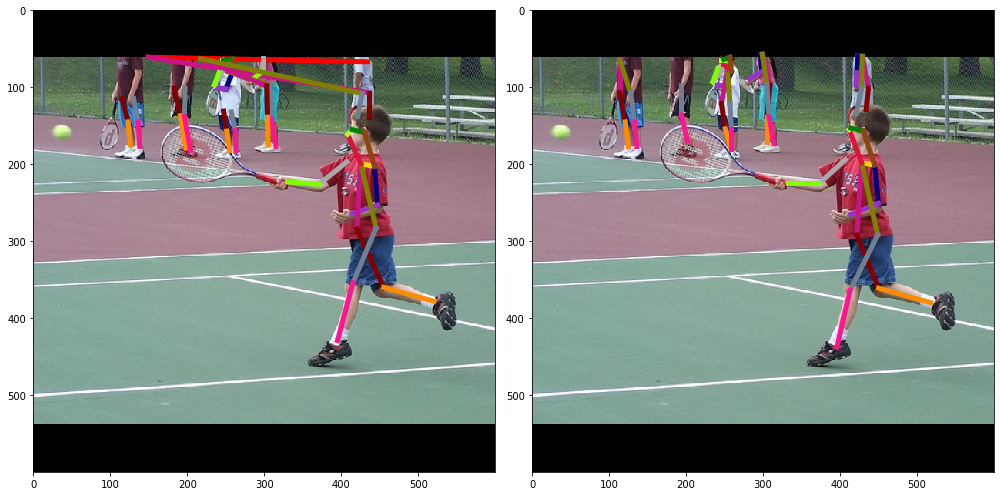

In [52]:
plt.figure(figsize=(14, 7))

plt.subplot(1,2,1)
ax = plt.gca()
title = "Pose from Labels"
visualizations.draw_pose(cur_img, pose_entries, all_keypoints, ax=ax, title=title, preprocess=True, bgr=True)

plt.subplot(1,2,2)
ax = plt.gca()
title = "Predicted Poses"
visualizations.draw_pose(cur_img, pose_entries_det, all_keypoints_det, ax=ax, title=title, preprocess=True, bgr=True)

plt.tight_layout()
plt.show()

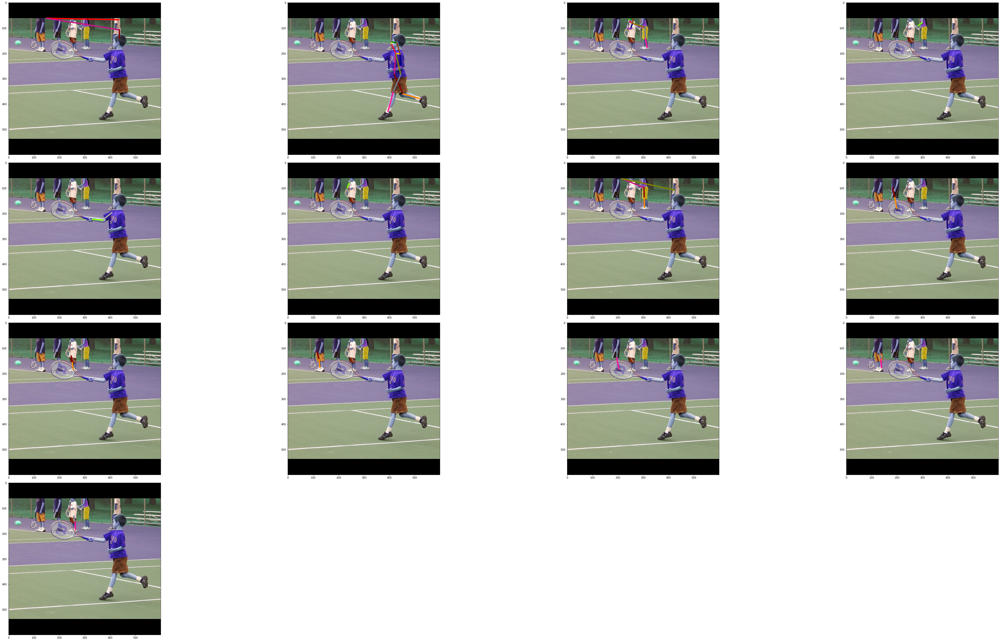

In [48]:
plt.figure(figsize=(60, 60))

for i in range(len(pose_entries)):
    plt.subplot(7,4,i+1)
    ax = plt.gca()
    title = f"Pose {i+1}"
    visualizations.draw_pose(cur_img, [pose_entries[i]], all_keypoints, ax=ax, title=title, preprocess=True)

plt.tight_layout()
plt.show()

16.0
8.0
13.0
3.0
3.0
7.0
7.0
3.0


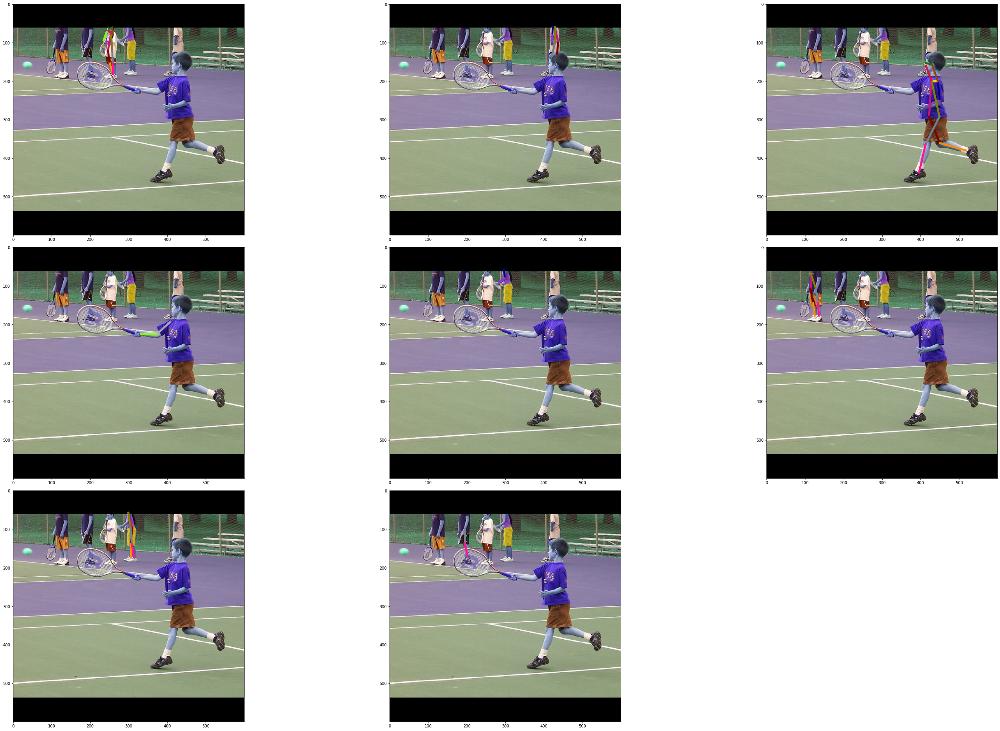

In [49]:
plt.figure(figsize=(40, 60))

for i in range(len(pose_entries_det)):
    plt.subplot(7,3,i+1)
    ax = plt.gca()
    title = f"Pose {i+1}"
    visualizations.draw_pose(cur_img, [pose_entries_det[i]], all_keypoints_det, ax=ax, title=title, preprocess=True)
    print(pose_entries_det[i][-1])
plt.tight_layout()
plt.show()

## Evaluation

In [2]:
print(scaled_hms.shape)
print(scaled_pafs.shape)
print(metadata.keys())

NameError: name 'scaled_hms' is not defined

In [68]:
# computing predictions, loading previous results and appending new ones
utils.reset_predictions_file(test_exp)
cur_predictions = metrics.compute_predictions_openpose(scaled_hms, scaled_pafs, metadata, cur_size=image_size)
# cur_predictions = metrics.compute_predictions_openpose(np.array(heatmaps[0,:]), np.array(pafs[0,:]), metadata, cur_size=image_size)
utils.update_predictions_file(cur_predictions, test_exp)

In [69]:
data_path = CONFIG["paths"]["data_path"]
labels_path = os.path.join(data_path, "annotations")
labels_file = os.path.join(labels_path, "person_keypoints_validation.json")
preds_file = os.path.join(test_exp, CONFIG["paths"]["submission"])

In [70]:
stats = metrics.compute_precision(labels_file=labels_file, preds_file=preds_file)

loading annotations into memory...
Done (t=0.27s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.151
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] = 0.505
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] = 0.124
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] = 0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.150
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] = 0.500
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | ma

## Additional Testing and Debbguing

In [ ]:
# data_path = CONFIG["paths"]["data_path"]
labels_path = os.path.join(data_path, "annotations")
labels_file = os.path.join(labels_path, "person_keypoints_validation.json")
image_id = int(metadata["image_name"][0].split(".")[0])

In [ ]:
with open(labels_file) as f:
    aux = json.load(f)

In [ ]:
coco_gt = COCO(labels_file)
print("\n")
coco_dt = coco_gt.loadRes(preds_file)

In [ ]:
cocoEval = COCOeval(coco_gt, coco_dt, "keypoints")
cocoEval._prepare()

In [ ]:
dets = cocoEval._dts[image_id, 1][0]
lbls = cocoEval._gts[image_id, 1][0]["keypoints"]
all_lbls = cocoEval._gts[image_id, 1]

In [ ]:
# dets_k = coco_keypoints_[0]
reshaped_dets_k = cur_predictions[0]["keypoints"]

print("IDX          Reshaped Dets   ----      Labels")
for i in range(len(reshaped_dets_k)//3):
#     if(reshaped_dets_k[3*i+2] == 0):
#         continue
    print(f"{i}:     {reshaped_dets_k[3*i: 3*i+3]}   ----   {lbls[3*i: 3*i+3]}")

<div class=alert style="background-color:#F5F5F5; border-color:#C8C8C8">
   This notebook was created by <b>Angel Villar-Corrales</b>
</div> 
